In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

In [2]:
adata = sc.read('../../../pipeline/data/multigrate/pbmc_healthy_covid/e177fabfad_adata_both.h5ad')
adata

AnnData object with n_obs × n_vars = 624325 × 2000
    obs: 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'full_clustering', 'initial_clustering', 'Resample', 'Collection_Day', 'Sex', 'Age_interval', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection', 'Status_on_day_collection_summary', 'Days_from_onset', 'Site', 'time_after_LPS', 'Worst_Clinical_Status', 'Outcome', 'patient_id', 'split0', 'split1', 'split2', 'split3', 'split4', 'group', 'cell_attn_0', 'cell_attn_1', 'cell_attn_2', 'cell_attn_3', 'cell_attn_4', 'cell_attn'
    var: 'feature_types', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable_nbatches', 'highly_variable_intersection', 'highly_variable'
    uns: 'hvg', 'leiden', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap', 'latent_0', 'latent_1', 'latent_2', 'latent_3', 'latent_4'
    layers: 'counts'

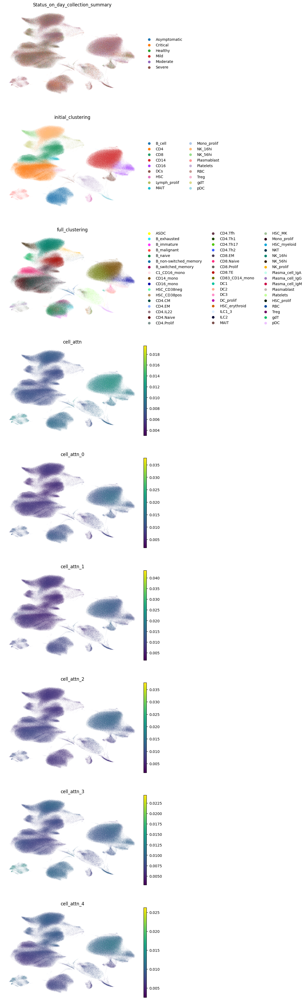

In [3]:
sc.pl.umap(
    adata,
    color=['Status_on_day_collection_summary', 'initial_clustering', 'full_clustering',
           'cell_attn', 'cell_attn_0', 'cell_attn_1', 'cell_attn_2', 'cell_attn_3', 'cell_attn_4'],
    ncols=1,
    frameon=False
)

-------- Asymptomatic -------


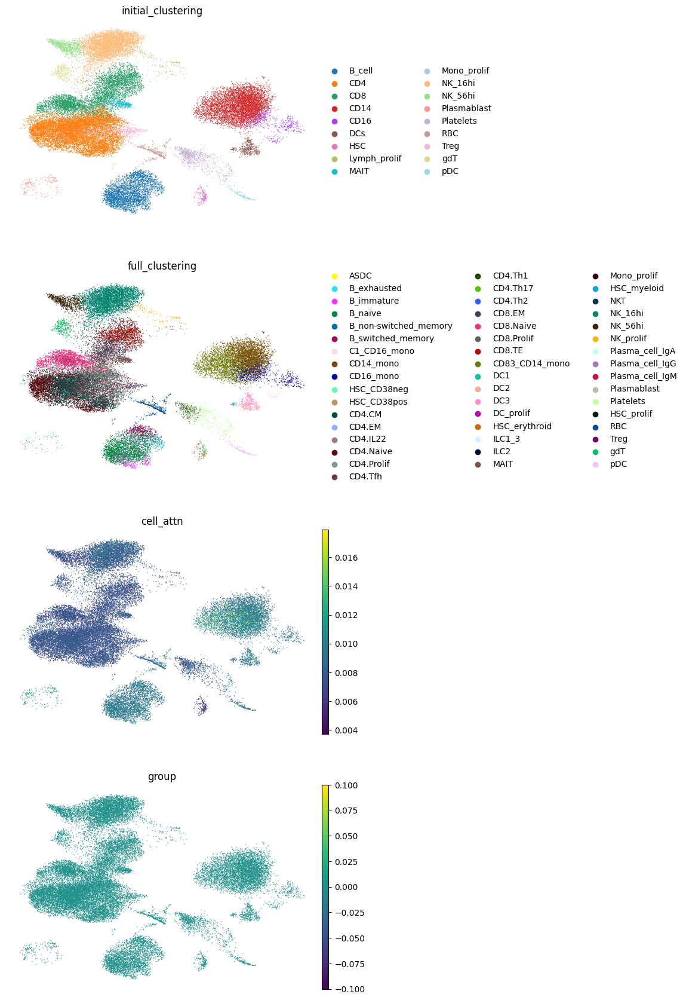

-------- Critical -------


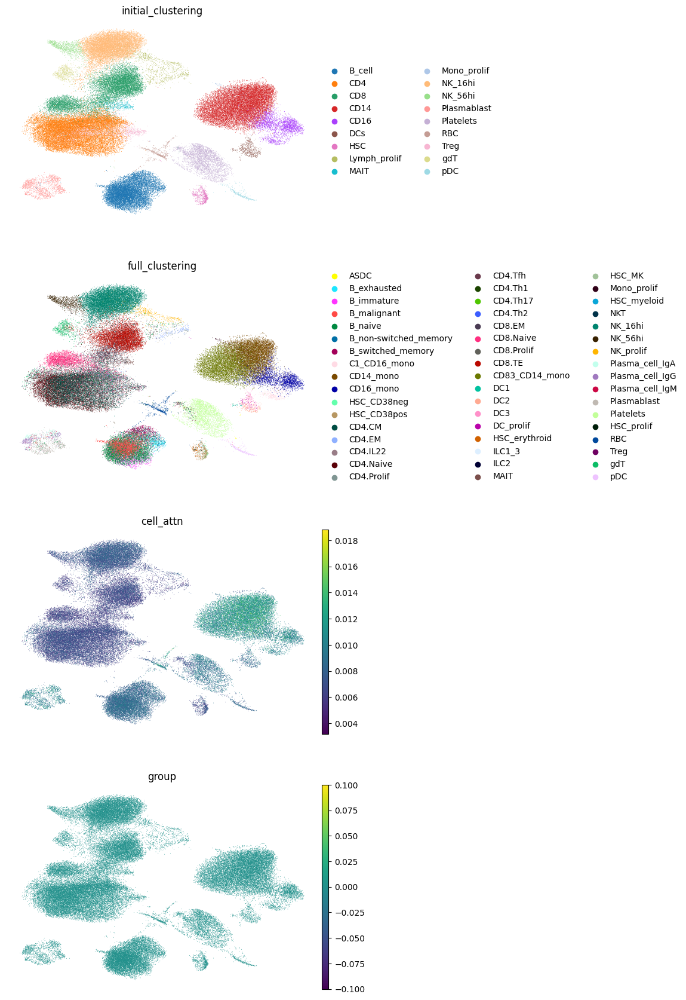

-------- Healthy -------


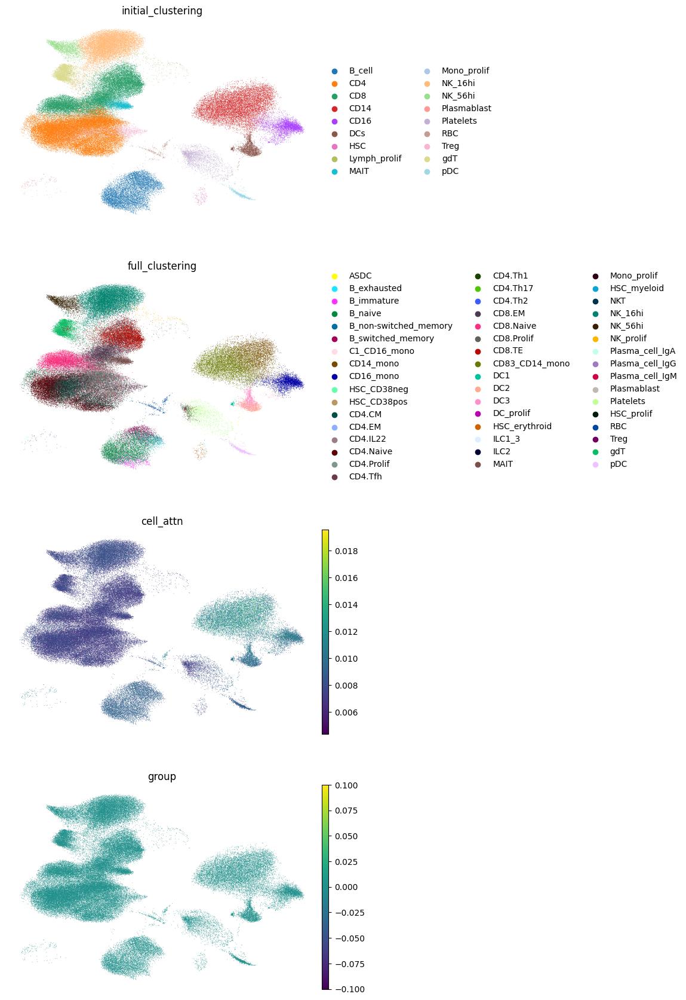

-------- Mild -------


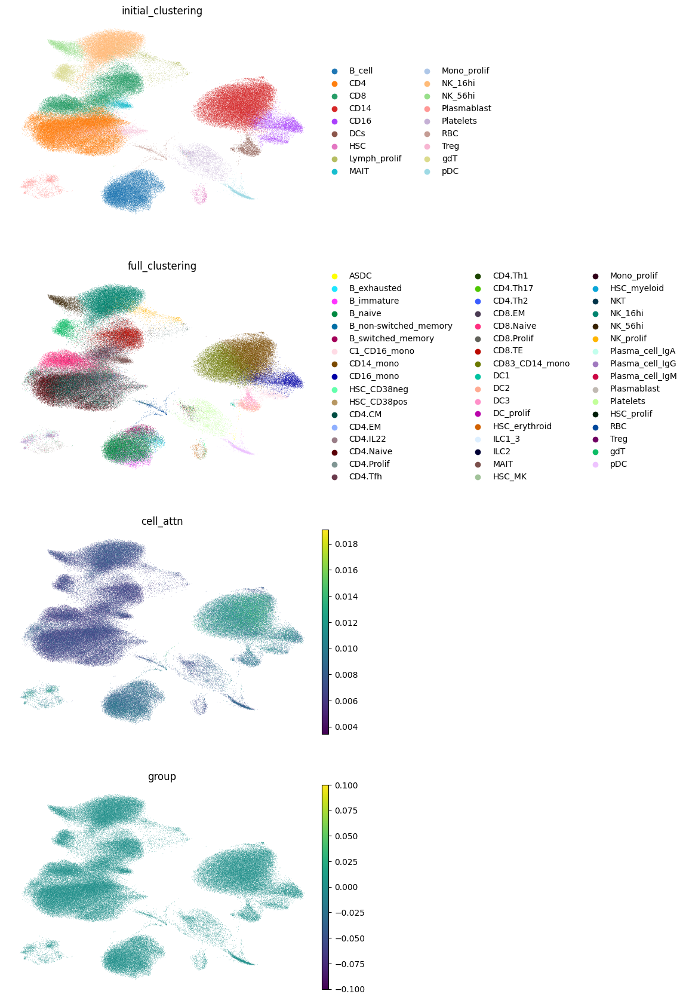

-------- Moderate -------


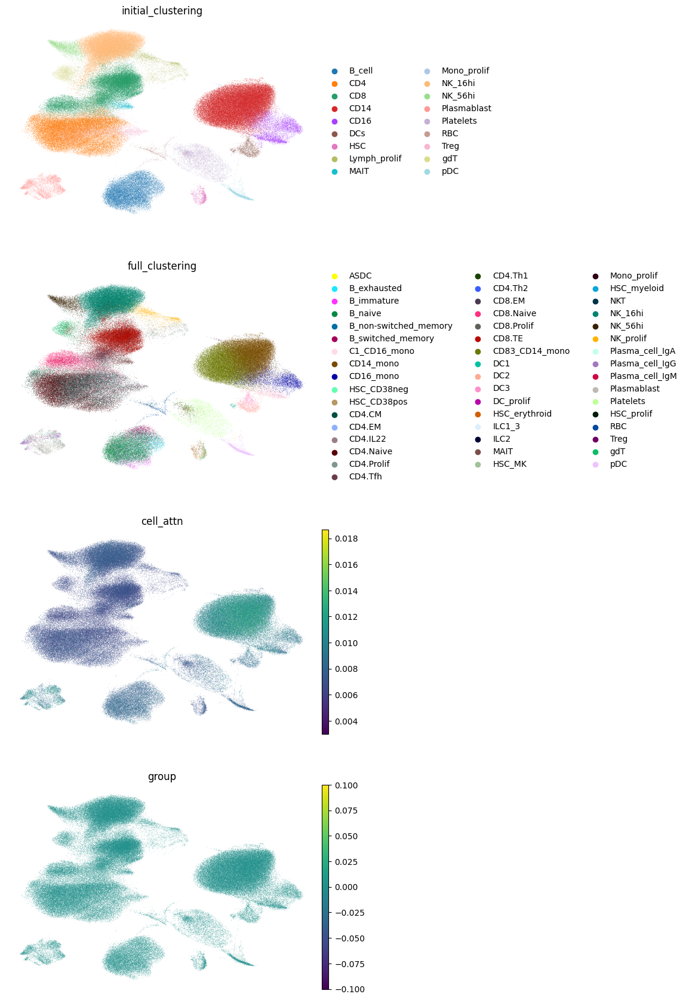

-------- Severe -------


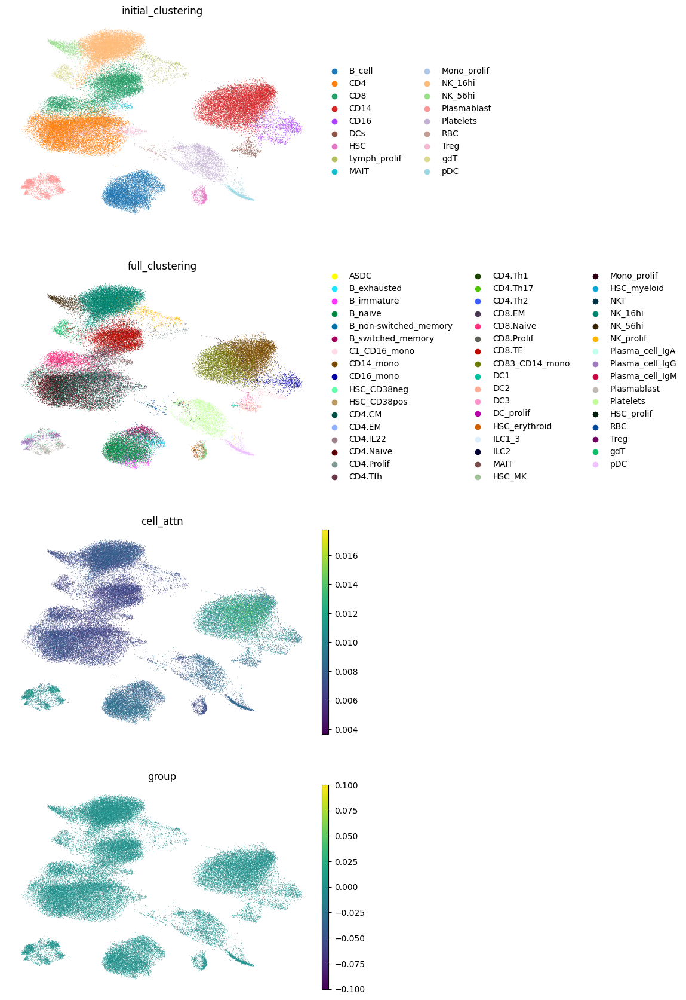

In [4]:
for cond in np.unique(adata.obs['Status_on_day_collection_summary']):
    adata_tmp = adata[adata.obs['Status_on_day_collection_summary'] == cond].copy()
    print(f'-------- {cond} -------')
    sc.pl.umap(
        adata_tmp,
        color=['initial_clustering', 'full_clustering', 'cell_attn', 'group'],
        ncols=1,
        frameon=False
    )

In [18]:
dfs = []
for cond in np.unique(adata.obs['Status_on_day_collection_summary']):
    adata_tmp = adata[adata.obs['Status_on_day_collection_summary'] == cond].copy()
    threshold_idx = int(len(adata_tmp) * 0.9)
    threshold_value = sorted(adata_tmp.obs['cell_attn'])[threshold_idx]
    adata_tmp.obs['group'] = 'all cells'
    adata_tmp.obs.loc[adata_tmp.obs['cell_attn'] >= threshold_value, 'group'] = 'top 10% cells'
    adata.obs[f'top_cells_{cond}'] = False
    adata.obs.loc[adata_tmp[adata_tmp.obs['group'] == 'top 10% cells'].obs_names, f'top_cells_{cond}'] = True
    adata.obs[f'top_cells_{cond}'] = adata.obs[f'top_cells_{cond}'].astype('category')
    dfs.append(adata_tmp[adata_tmp.obs['group'] == 'top 10% cells'].obs[['initial_clustering', 'Status_on_day_collection_summary']])

In [21]:
adata.obs.loc[adata_tmp[adata_tmp.obs['group'] == 'top 10% cells'].obs_names, 'top_cells_Severe']

covid_index
AAACCTGGTACATGTC-MH9143325    True
AAACCTGGTGCCTTGG-MH9143325    True
AAACGGGAGAGTCTGG-MH9143325    True
AAACGGGAGGCCATAG-MH9143325    True
AAACGGGCACCGGAAA-MH9143325    True
                              ... 
BGCV15_GCATGATTCCTCATTA-1     True
BGCV15_GGACATTGTTCGTTGA-1     True
BGCV15_GTTCTCGGTACCCAAT-1     True
BGCV15_TGCGGGTCAGGTGGAT-1     True
BGCV15_TGGTTCCTCTGCTGCT-1     True
Name: top_cells_Severe, Length: 7827, dtype: category
Categories (2, bool): [False, True]

In [27]:
np.sum(adata.obs['top_cells_Severe'] == True)

7827

In [ ]:
adata.obs.loc[adata_tmp[adata_tmp.obs['group'] == 'top 10% cells'].obs_names, f'top_cells_{cond}']

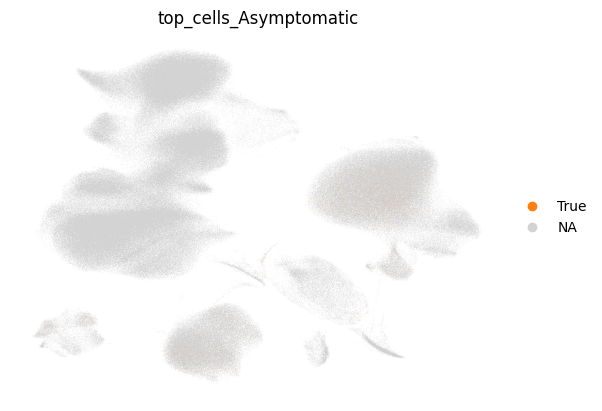

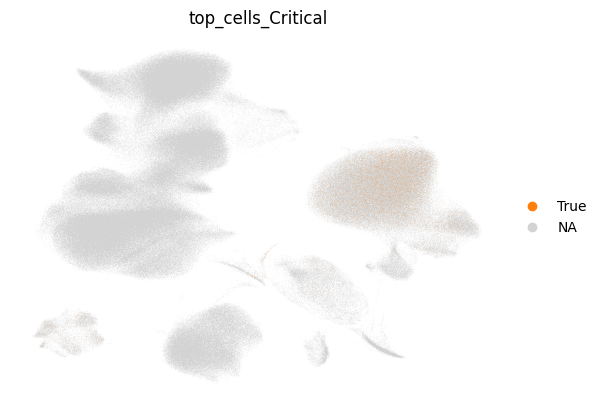

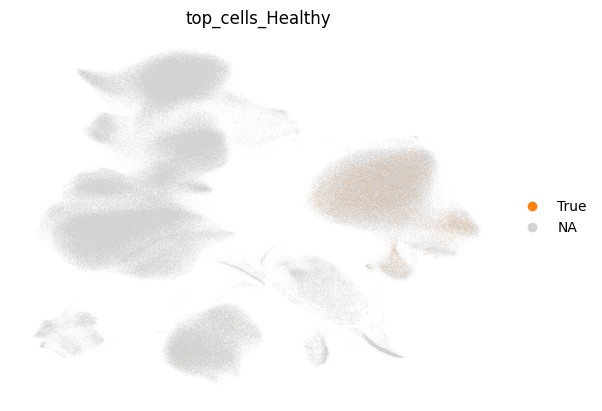

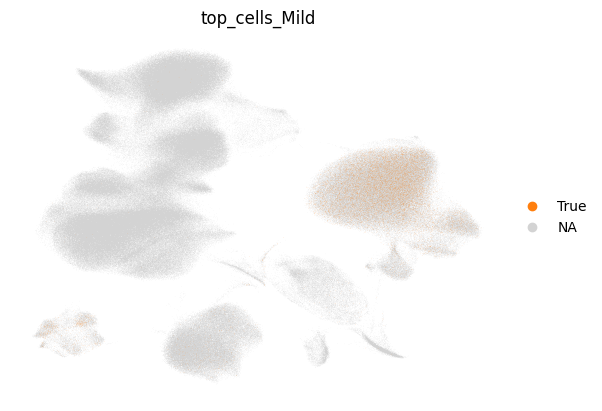

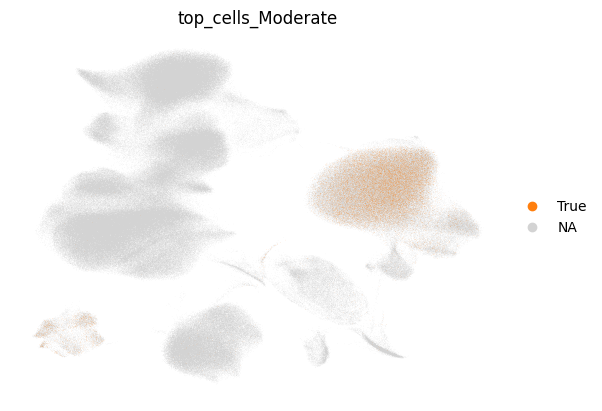

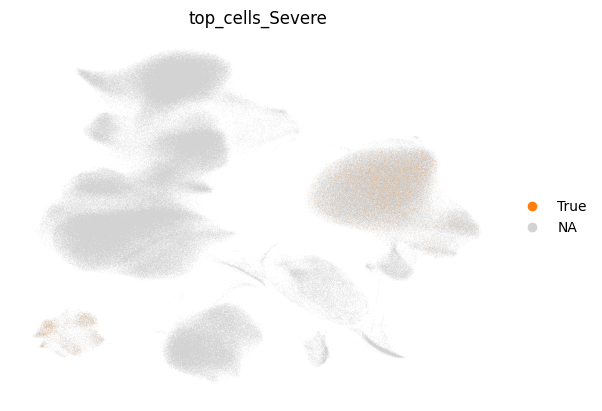

In [29]:
for cond in np.unique(adata.obs['Status_on_day_collection_summary']):
    sc.pl.umap(adata, color=[f'top_cells_{cond}'], groups=[True], frameon=False)

In [10]:
df = pd.concat(dfs)
df

,initial_clustering,Status_on_day_collection_summary
covid_index,,
AAACCTGCAGCCAATT-MH9143425,CD14,Asymptomatic
AAACCTGTCGCCTGTT-MH9143425,CD16,Asymptomatic
AAAGCAAGTCCGTCAG-MH9143425,CD14,Asymptomatic
AAAGTAGCAATGAAAC-MH9143425,CD14,Asymptomatic
AAATGCCTCAAACAAG-MH9143425,CD14,Asymptomatic
...,...,...
BGCV15_GCATGATTCCTCATTA-1,CD14,Severe
BGCV15_GGACATTGTTCGTTGA-1,CD14,Severe
BGCV15_GTTCTCGGTACCCAAT-1,Plasmablast,Severe


In [40]:
df_group = df.groupby('Status_on_day_collection_summary').value_counts(normalize=True).mul(100)
df_group

Status_on_day_collection_summary  initial_clustering
Asymptomatic                      CD14                  52.543886
                                  B_cell                24.397501
                                  CD16                   4.760488
                                  Plasmablast            4.076168
                                  DCs                    4.076168
                                                          ...    
Severe                            Treg                   0.012776
                                  NK_56hi                0.012776
                                  HSC                    0.012776
                                  MAIT                   0.012776
                                  gdT                    0.012776
Name: proportion, Length: 96, dtype: float64

In [41]:
df_group = df_group.unstack().reindex(['Asymptomatic', 'Healthy', 'Mild', 'Moderate', 'Severe', 'Critical'])

In [42]:
df_group

initial_clustering,B_cell,CD14,CD16,CD4,CD8,DCs,HSC,Lymph_prolif,MAIT,Mono_prolif,NK_16hi,NK_56hi,Plasmablast,Platelets,RBC,Treg,gdT,pDC
Status_on_day_collection_summary,,,,,,,,,,,,,,,,,,
Asymptomatic,24.397501,52.543886,4.760488,1.398393,0.803332,4.076168,0.089259,0.148765,0.029753,NaN,3.094317,0.238024,4.076168,1.279381,2.112467,0.059506,0.208271,0.684320
Healthy,6.883759,69.002473,13.798434,0.999588,0.577082,4.936109,0.010305,0.020610,0.010305,0.010305,0.659522,0.051525,0.721352,0.896538,0.700742,0.051525,0.133965,0.535862
Mild,3.163160,78.725908,10.798882,0.132411,0.029425,1.419744,NaN,0.014712,NaN,0.066206,0.198617,0.007356,4.546123,0.411946,0.382522,0.022069,0.022069,0.058849
Moderate,0.483286,86.120620,6.655256,0.080548,0.075513,0.443012,NaN,NaN,NaN,0.221506,0.050342,NaN,5.195328,0.276883,0.286951,0.005034,0.005034,0.100685
Severe,0.792130,80.605596,5.711000,0.140539,0.025553,0.383289,0.012776,NaN,0.012776,0.383289,0.076658,0.012776,11.358119,0.268302,0.114987,0.012776,0.012776,0.076658
Critical,1.199604,80.150878,9.337126,0.383379,0.049468,0.395746,NaN,0.012367,NaN,0.383379,0.037101,NaN,4.217165,2.386841,1.323275,0.074202,NaN,0.049468


In [44]:
color = []
for ct in df_group.columns:
    idx = list(adata.obs['initial_clustering'].cat.categories).index(ct)
    color.append(adata.uns['initial_clustering_colors'][idx])
len(color)

18

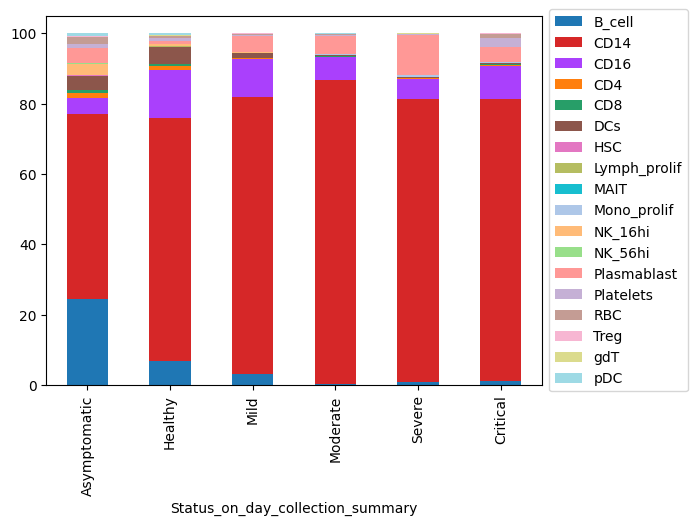

In [46]:
df_group.plot.bar(stacked=True, color=color).legend(loc='center left',bbox_to_anchor=(1.0, 0.5))

In [47]:
mono = adata[adata.obs['initial_clustering'] == 'CD14'].copy()
mono

AnnData object with n_obs × n_vars = 121283 × 2000
    obs: 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'full_clustering', 'initial_clustering', 'Resample', 'Collection_Day', 'Sex', 'Age_interval', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection', 'Status_on_day_collection_summary', 'Days_from_onset', 'Site', 'time_after_LPS', 'Worst_Clinical_Status', 'Outcome', 'patient_id', 'split0', 'split1', 'split2', 'split3', 'split4', 'group', 'cell_attn_0', 'cell_attn_1', 'cell_attn_2', 'cell_attn_3', 'cell_attn_4', 'cell_attn', 'top_cells_Asymptomatic', 'top_cells_Critical', 'top_cells_Healthy', 'top_cells_Mild', 'top_cells_Moderate', 'top_cells_Severe'
    var: 'feature_types', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable_nbatches', 'highly_variable_intersection', 'highly_variable'
    uns: 'hvg', 'leiden', 'neighbors', 'pca', 'umap', 'Status_on_day_collection_summary_colors', 'initial_cl

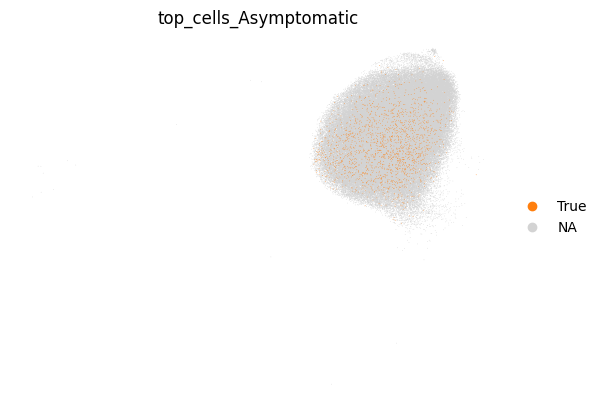

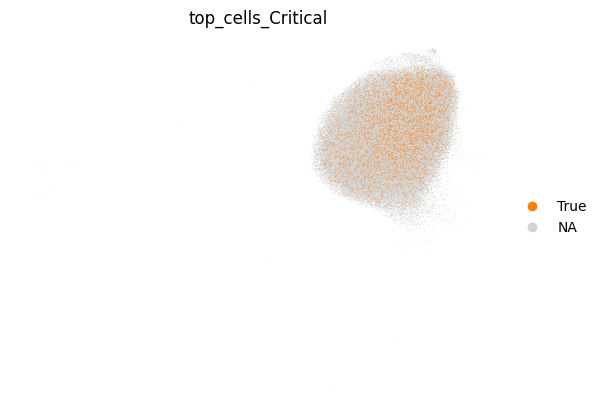

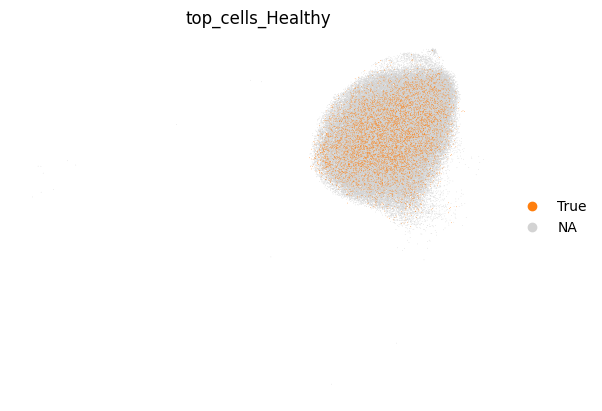

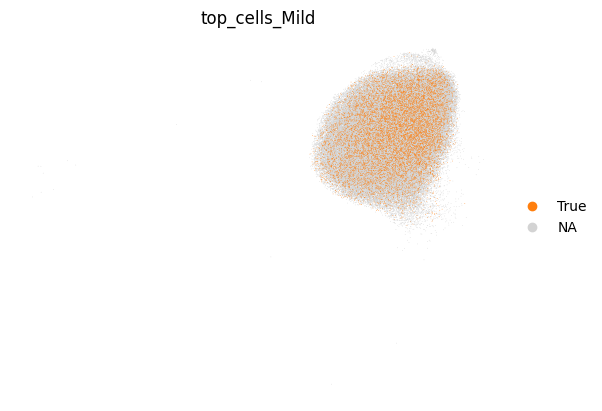

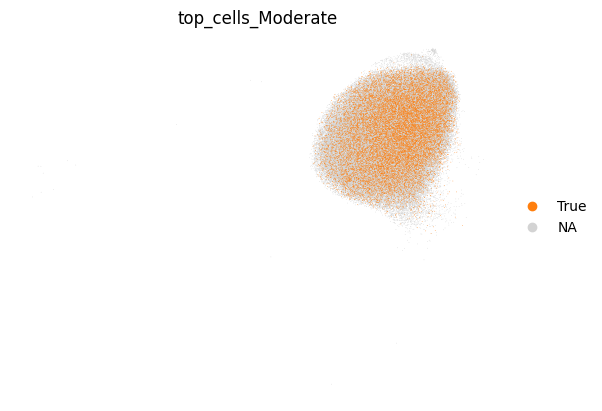

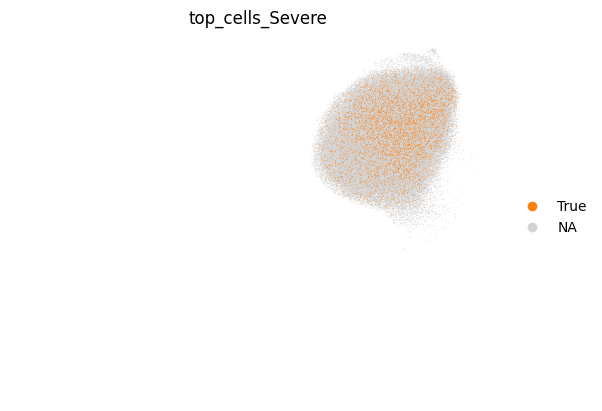

In [48]:
for cond in np.unique(mono.obs['Status_on_day_collection_summary']):
    sc.pl.umap(mono, color=[f'top_cells_{cond}'], groups=[True], frameon=False)